In [85]:

import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import psycopg2



In [128]:
DBNAME = "opportunity_youth"
conn = psycopg2.connect(dbname=DBNAME)

pumadf = pd.read_sql("""SELECT  CONCAT(statefp,countyfp,tractce) AS "GEOID", puma5ce FROM ct_puma_xwalk  ORDER BY "GEOID" """, conn)
pumadf['GEOID'] = pumadf['GEOID'].astype('int')

ipums = "//Users/timothycummins/Downloads/ipums_puma_2010"
ipum_df = gpd.read_file(ipums)
fp = "//Users/timothycummins/Downloads/tl_2017_53_cousub"
m_df = gpd.read_file(fp)
m_df['GEOID'] = m_df['GEOID'].astype('int')
hi = []
if 5300390096 in list(pumadf['GEOID']):
    print("should work")


    
#pumadf['GEOID']

pumadf = pd.read_sql("""SELECT  * FROM puma_names_2010 WHERE state_fips like '53' LIMIT 10""", conn)
#list(pumadf.keys())
ipum_df.head()

,GISMATCH,GISJOIN,GEOID,STATEFIP,State,PUMA,Name,geometry
0,600105,G06000105,0600105,06,California,00105,"Alameda County (West)--San Leandro, Alameda & ...","MULTIPOLYGON (((-2258646.530 342733.341, -2258..."
1,600102,G06000102,0600102,06,California,00102,Alameda County (Northwest)--Oakland (Northwest...,"POLYGON ((-2259099.372 353383.127, -2259101.40..."
2,608502,G06008502,0608502,06,California,08502,Santa Clara County (Northwest)--Sunnyvale & Sa...,"POLYGON ((-2246220.131 304622.390, -2246216.04..."
3,600108,G06000108,0600108,06,California,00108,"Alameda County (Southwest)--Union City, Newark...","MULTIPOLYGON (((-2247215.331 305414.315, -2247..."
4,600107,G06000107,0600107,06,California,00107,Alameda County (Central)--Hayward City PUMA,"POLYGON ((-2244205.948 331582.334, -2244209.13..."


In [ ]:
# set the range for the choropleth values
variable = map_df['COUNTYFP'] == '033'
map_df['colors'] = np.where(map_df['COUNTYFP'] == '033', 5,4)



vmin, vmax = 45, 50

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(16,12))

ax.set_ylim([46, 49])
ax.set_xlim([-124.5, -120.5])

# remove the axis
ax.axis('off')

# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

# empty array for the data range
sm.set_array([])

# create map
map_df.plot(column=variable, cmap='plasma', linewidth=0.8, ax=ax, edgecolor='1')

# Add Labels
map_df['coords'] = map_df['geometry'].apply(lambda x: x.representative_point().coords[:])
map_df['coords'] = [coords[0] for coords in map_df['coords']]

# Create column to only show names of cities in South King County
map_df['skc'] = map_df['COUNTYFP'][variable] 
map_df['skc'] = np.where(map_df['skc'] == '033',map_df['NAME'],'')


# Display names 
for idx, row in map_df.iterrows():
    plt.annotate(s=row['skc'], xy=row['coords'],horizontalalignment='center')

In [0]:

map_df = pd.merge(m_df,pumadf,how= 'left',on=['GEOID']) 
map_df.head()


In [0]:

# set the range for the choropleth values
variable = map_df['COUNTYFP'] == '033'
map_df['colors'] = np.where(map_df['COUNTYFP'] == '033', 5,4)



vmin, vmax = 45, 50

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(16,12))

ax.set_ylim([46, 49])
ax.set_xlim([-124.5, -120.5])

# remove the axis
ax.axis('off')

# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

# empty array for the data range
sm.set_array([])

# create map
map_df.plot(column=variable, cmap='plasma', linewidth=0.8, ax=ax, edgecolor='1')

# Add Labels
map_df['coords'] = map_df['geometry'].apply(lambda x: x.representative_point().coords[:])
map_df['coords'] = [coords[0] for coords in map_df['coords']]

# Create column to only show names of cities in South King County
map_df['skc'] = map_df['COUNTYFP'][variable] 
map_df['skc'] = np.where(map_df['skc'] == '033',map_df['NAME'],'')


# Display names 
for idx, row in map_df.iterrows():
    plt.annotate(s=row['skc'], xy=row['coords'],horizontalalignment='center')

In [133]:
list(map_df.keys())

['STATEFP',
 'COUNTYFP',
 'COUSUBFP',
 'COUSUBNS',
 'GEOID',
 'NAME',
 'NAMELSAD',
 'LSAD',
 'CLASSFP',
 'MTFCC',
 'CNECTAFP',
 'NECTAFP',
 'NCTADVFP',
 'FUNCSTAT',
 'ALAND',
 'AWATER',
 'INTPTLAT',
 'INTPTLON',
 'geometry',
 'colors',
 'coords',
 'skc']

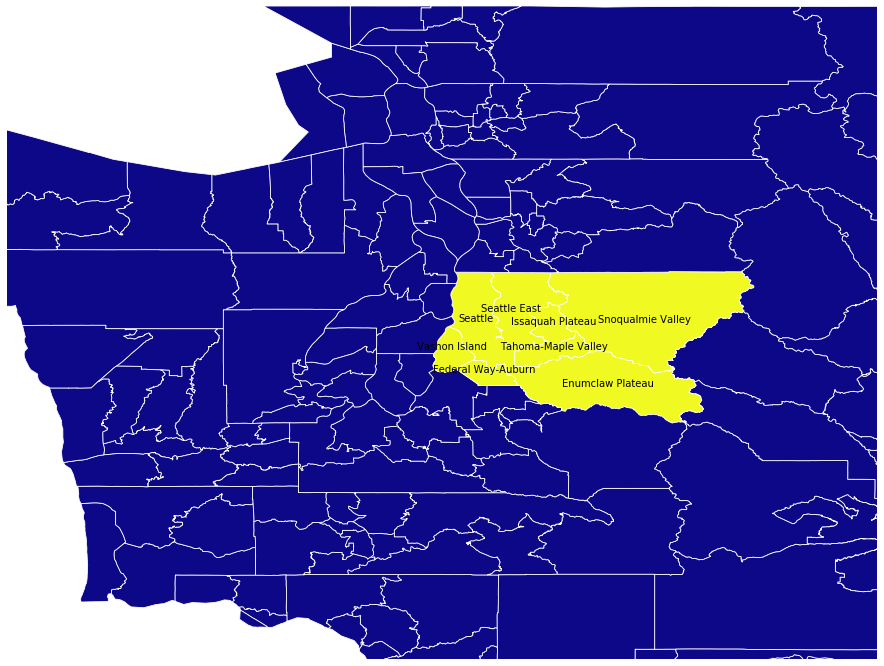

In [129]:
#dont change working


fp = "//Users/timothycummins/Downloads/tl_2017_53_cousub"
map_df = gpd.read_file(fp)
plt.rcParams['figure.figsize'] = [16, 12] #height, width


# set the range for the choropleth values
variable = map_df['COUNTYFP'] == '033'
map_df['colors'] = np.where(map_df['COUNTYFP'] == '033', 5,4)



vmin, vmax = 45, 50

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(16,12))

ax.set_ylim([46, 49])
ax.set_xlim([-124.5, -120.5])

# remove the axis
ax.axis('off')

# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))

# empty array for the data range
sm.set_array([])

# create map
map_df.plot(column=variable, cmap='plasma', linewidth=0.8, ax=ax, edgecolor='1')

# Add Labels
map_df['coords'] = map_df['geometry'].apply(lambda x: x.representative_point().coords[:])
map_df['coords'] = [coords[0] for coords in map_df['coords']]

# Create column to only show names of cities in South King County
map_df['skc'] = map_df['COUNTYFP'][variable] 
map_df['skc'] = np.where(map_df['skc'] == '033',map_df['NAME'],'')


# Display names 
for idx, row in map_df.iterrows():
    plt.annotate(s=row['skc'], xy=row['coords'],horizontalalignment='center')

In [0]:
variable = map_df['COUSUBFP'] == range(11610,11615)
variable

In [0]:
map_df.head()